In [2]:
!pip install tslearn tsfresh

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [3]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# увеличим количество отображаемых столбцов
pd.set_option("display.max_columns", None)
# увеличим количество отображаемых рядов
pd.set_option("display.max_rows", 500)
# увеличим ширину столбцов
pd.options.display.max_colwidth = 250

# отключаем экспоненциальное представление
pd.set_option("display.float_format", lambda x: "%.2f" % x)

import numpy as np

from tsfresh import extract_features, select_features
from tsfresh.utilities.dataframe_functions import impute

from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial import Voronoi
from scipy.spatial.distance import squareform

from tslearn.metrics import dtw
from tslearn.clustering import TimeSeriesKMeans

from tqdm.autonotebook import tqdm

from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17072\99301902.py:29: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


# Кластеризация профилей добычи

In [49]:
# Define the path to the data file
path = "hw/train.csv"

# Load the data file into a pandas DataFrame. The delimiter is set to tab character as the file is a TSV (Tab-separated values) file
df = pd.read_csv(path, delimiter=",")

# Convert all column names to lower case to maintain consistency and ease of access
df.columns = [x.lower() for x in df.columns]

# Replace any occurrence of the string "well" in the 'well' column with an empty string and convert the values to lower case
df["cat"] = df["cat"].str.lower().str.replace("cat", "")

# Convert the 'date' column to datetime format for easier manipulation in future operations
df["date"] = pd.to_datetime(df["date"])

# Display the first 5 rows of the DataFrame for a quick overview of the data
df.head()

,cat,date,gor,gas,oil,watercut,water,bhp,group,water_inj
0,hw-3,2020-02-01,731.41,3660375.42,5004.51,0.00,0.00,3274.06,P,NaN
1,hw-3,2020-03-01,731.41,3782298.54,5171.21,0.00,0.00,3237.29,P,NaN
2,hw-3,2020-04-01,731.41,3571576.79,4883.11,0.00,0.00,3221.12,P,NaN
3,hw-3,2020-05-01,731.41,3653934.82,4995.71,0.00,0.00,3196.40,P,NaN
4,hw-3,2020-06-01,731.41,3611093.24,4937.13,0.00,0.00,3187.04,P,NaN


Находим количество уникальных скважин. Находим названия скважин 

In [50]:
# This block of code operates on a DataFrame named 'df' which contains data about wells.

# Count the total number of unique wells in the DataFrame
print(len(df["cat"].unique()))

# Output the names of the unique wells
print(df["cat"].unique())

447
['hw-3' 'hw-4' 'hw-5' 'hw-6' 'hw-7' 'hw-8' 'hw-9' 'hw-10' 'hw-24' 'hw-25'
 'hw-26' 'hw-27' 'hw-28' 'hw-29' 'hw-30' 'hw-31' 'hw-32' 'well-1'
 'well-10' 'well-100' 'well-101' 'well-102' 'well-103' 'well-104'
 'well-105' 'well-106' 'well-107' 'well-108' 'well-109' 'well-11'
 'well-110' 'well-111' 'well-112' 'well-113' 'well-114' 'well-115'
 'well-116' 'well-117' 'well-118' 'well-119' 'well-12' 'well-120'
 'well-121' 'well-122' 'well-123' 'well-124' 'well-125' 'well-126'
 'well-127' 'well-128' 'well-129' 'well-13' 'well-130' 'well-131'
 'well-132' 'well-133' 'well-134' 'well-135' 'well-136' 'well-137'
 'well-138' 'well-139' 'well-14' 'well-140' 'well-141' 'well-142'
 'well-143' 'well-144' 'well-145' 'well-146' 'well-147' 'well-148'
 'well-149' 'well-15' 'well-150' 'well-151' 'well-152' 'well-153'
 'well-154' 'well-155' 'well-156' 'well-157' 'well-158' 'well-159'
 'well-16' 'well-160' 'well-161' 'well-162' 'well-163' 'well-164'
 'well-165' 'well-166' 'well-167' 'well-168' 'well-169' 'we

Отрисуем дебет скважин на графике

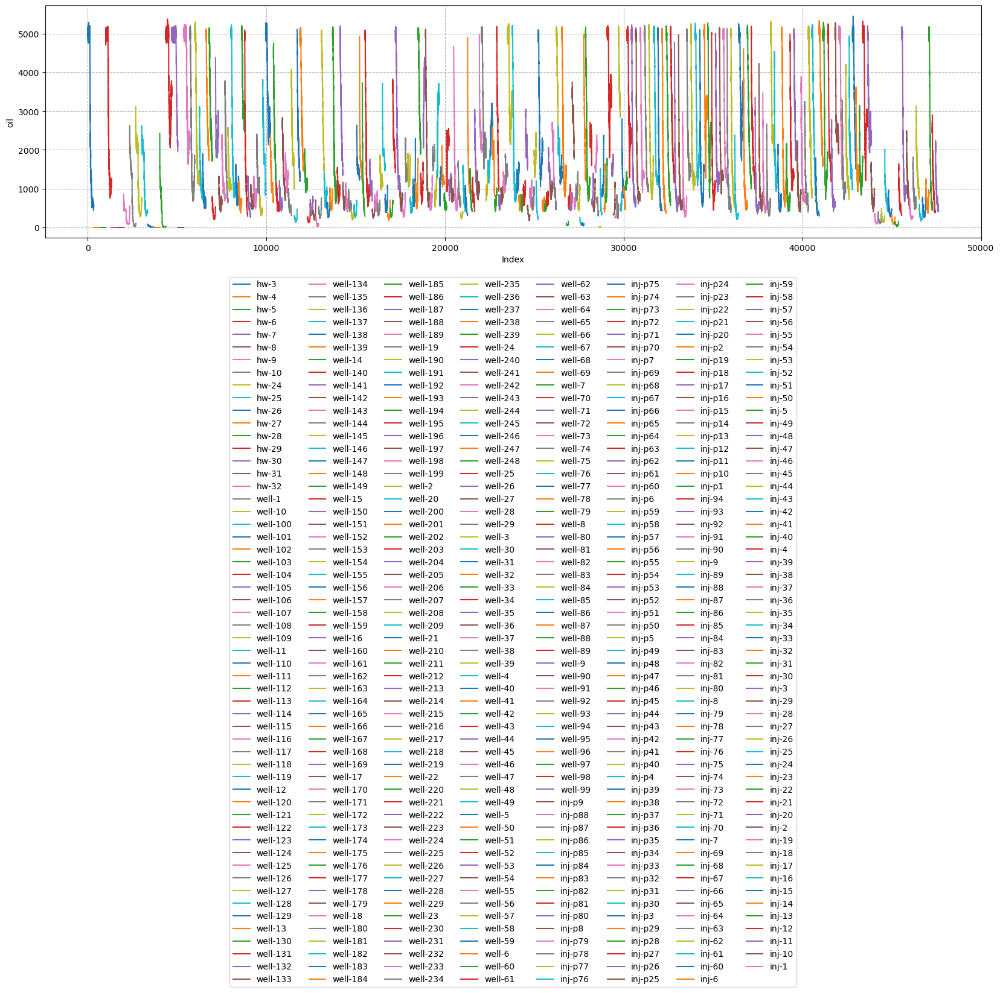

In [51]:
# 'qoil' is the column we're interested in plotting
column = "oil"

# Create a new figure with specified size
plt.figure(figsize=(20, 5))

# Loop over each unique well in the dataframe
for i, col in enumerate(df["cat"].unique()):
    # Plot the 'qoil' values for the current well
    plt.plot(df[df["cat"] == col][column], label=col)

# Set up a legend to identify the wells in the plot
leg = plt.legend(loc="upper center", frameon=True, bbox_to_anchor=(0.5, -0.15), ncol=8)

# Add a grid to the plot with dashed lines (ls="--")
plt.grid(ls="--")

plt.xlabel("Index")

plt.ylabel(column)

plt.show()

In [52]:
df.head(1)

,cat,date,gor,gas,oil,watercut,water,bhp,group,water_inj
0,hw-3,2020-02-01,731.41,3660375.42,5004.51,0.00,0.00,3274.06,P,NaN


Создам таблицу данных по скважинам 

In [53]:
# Defines the column name that we are interested in
column = "oil"

# Pivots the DataFrame to create a new DataFrame
# The new DataFrame has "date" as its index, "well" as its columns, and the values of the specified "column" as its values
# The 'fillna' method is used to fill any NA/NaN values using the 'bfill' method, which propagates the next valid observation backward to the previous valid
data = df.pivot_table(index="date", columns="cat", values=column).fillna(
    method="bfill"
)

data.head()

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17072\2411678551.py:7: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = df.pivot_table(index="date", columns="cat", values=column).fillna(


cat,hw-10,hw-24,hw-25,hw-26,hw-27,hw-28,hw-29,hw-3,hw-30,hw-31,hw-32,hw-4,hw-5,hw-6,hw-7,hw-8,hw-9,well-1,well-10,well-100,well-101,well-102,well-103,well-104,well-105,well-106,well-107,well-108,well-109,well-11,well-110,well-111,well-112,well-113,well-114,well-115,well-116,well-117,well-118,well-119,well-12,well-120,well-121,well-122,well-123,well-124,well-125,well-126,well-127,well-128,well-129,well-13,well-130,well-131,well-132,well-133,well-134,well-135,well-136,well-137,well-138,well-139,well-14,well-140,well-141,well-142,well-143,well-144,well-145,well-146,well-147,well-148,well-149,well-15,well-150,well-151,well-152,well-153,well-154,well-155,well-156,well-157,well-158,well-159,well-16,well-160,well-161,well-162,well-163,well-164,well-165,well-166,well-167,well-168,well-169,well-17,well-170,well-171,well-172,well-173,well-174,well-175,well-176,well-177,well-178,well-179,well-18,well-180,well-181,well-182,well-183,well-184,well-185,well-186,well-187,well-188,well-189,well-19,well-190,well-191,well-192,well-193,well-194,well-195,well-196,well-197,well-198,well-199,well-2,well-20,well-200,well-201,well-202,well-203,well-204,well-205,well-206,well-207,well-208,well-209,well-21,well-210,well-211,well-212,well-213,well-214,well-215,well-216,well-217,well-218,well-219,well-22,well-220,well-221,well-222,well-223,well-224,well-225,well-226,well-227,well-228,well-229,well-23,well-230,well-231,well-232,well-233,well-234,well-235,well-236,well-237,well-238,well-239,well-24,well-240,well-241,well-242,well-243,well-244,well-245,well-246,well-247,well-248,well-25,well-26,well-27,well-28,well-29,well-3,well-30,well-31,well-32,well-33,well-34,well-35,well-36,well-37,well-38,well-39,well-4,well-40,well-41,well-42,well-43,well-44,well-45,well-46,well-47,well-48,well-49,well-5,well-50,well-51,well-52,well-53,well-54,well-55,well-56,well-57,well-58,well-59,well-6,well-60,well-61,well-62,well-63,well-64,well-65,well-66,well-67,well-68,well-69,well-7,well-70,well-71,well-72,well-73,well-74,well-75,well-76,well-77,well-78,well-79,well-8,well-80,well-81,well-82,well-83,well-84,well-85,well-86,well-87,well-88,well-89,well-9,well-90,well-91,well-92,well-93,well-94,well-95,well-96,well-97,well-98,well-99
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-01,2622.96,3112.10,2577.73,79.30,0.00,2427.48,4957.31,5004.51,5035.08,0.00,5029.85,0.00,0.00,5063.54,0.00,0.00,853.50,4877.98,5161.82,2901.50,1701.21,5017.87,4741.66,734.64,4388.95,1228.55,2162.07,3745.89,2397.40,5072.94,1394.64,1016.87,5077.91,4879.40,1186.24,961.28,1169.98,2290.03,710.99,3692.33,5025.73,2259.92,4669.41,1079.22,994.31,2570.24,1792.02,822.49,3830.20,267.76,5075.16,4985.64,2029.08,228.76,549.23,380.84,263.01,466.09,4857.97,1294.30,544.83,869.47,5036.28,1386.67,5023.15,966.41,1000.21,893.54,388.18,464.03,2469.53,4924.27,3726.58,4982.55,1589.70,438.24,713.06,495.72,1812.72,3716.16,621.18,338.47,470.01,3826.25,5056.65,780.96,489.95,2092.00,1774.16,692.55,1140.18,987.79,5077.23,1240.41,2928.44,4906.93,696.56,2080.79,954.08,2725.84,1266.34,1980.86,790.80,2501.65,1139.37,1014.23,4671.71,1635.40,330.55,1492.35,985.79,4904.44,1331.89,1149.36,2786.27,1325.50,4983.21,5052.57,1036.77,1613.02,2608.03,2486.51,666.44,4808.20,698.36,985.52,1369.71,1891.42,4918.80,5001.89,1413.59,816.92,617.78,943.30,2869.39,548.93,871.97,773.40,1883.63,1197.23,5079.29,635.79,416.87,824.10,1944.52,994.35,2471.93,1100.49,5003.83,2623.56,1420.40,4955.35,95.28,738.50,461.77,3742.96,746.41,949.45,589.57,248.50,118.33,4927.34,5076.68,2705.61,650.56,652.03,1559.89,778.36,7.54,1526.49,834.08,489.80,816.50,5097.30,1656.12,337.56,260.64,788.68,5208.32,479.71,2794.66,974.86,1010.96,4948.26,4980.46,4916.97,4854.90,4917.97,4924.31,5025.26,4970.01,4961.02,4866.59,5038.15,4773.60,4967.30,2974.35,5022.79,5

Визуализирую профили добычи

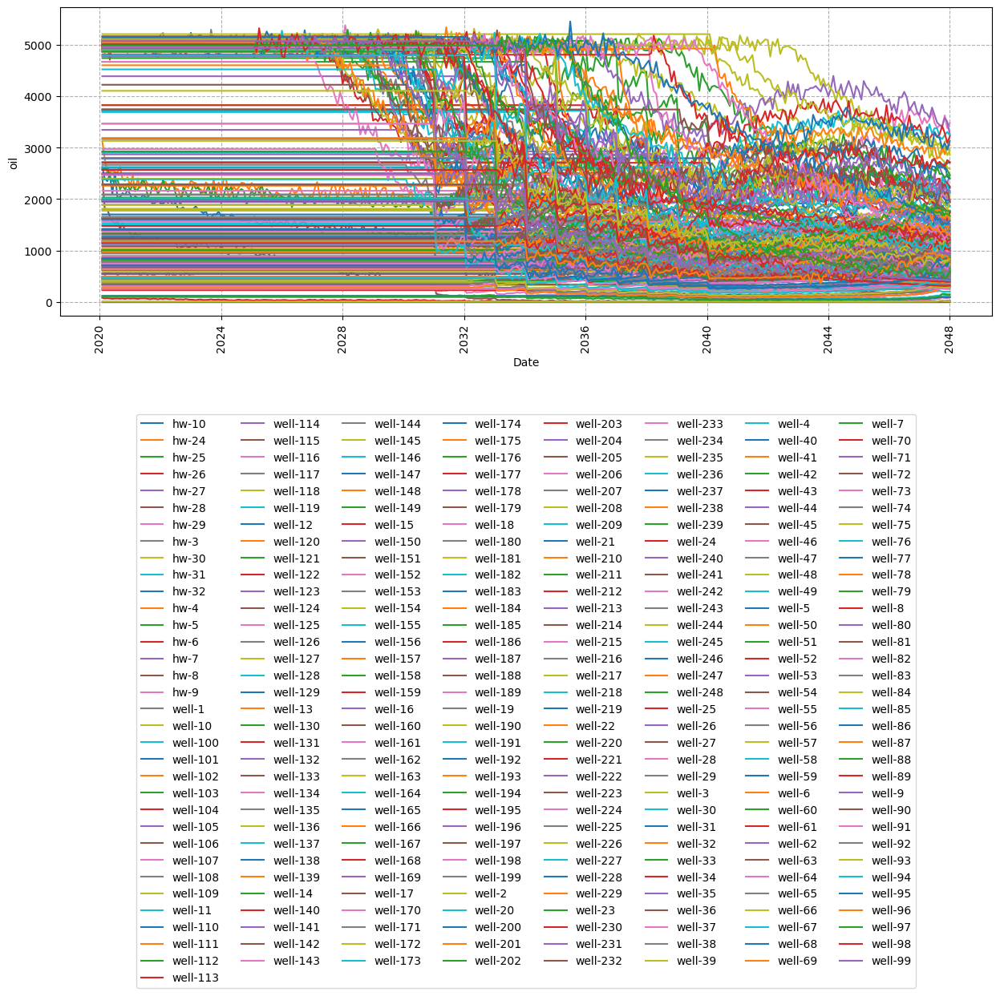

In [54]:
# Define a list of line styles for the plot
ls = [
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
    "-",
]

plt.figure(figsize=(15, 5))

# Loop over each column in the dataframe
for i, col in enumerate(data.columns):
    # For each column, plot the data with the corresponding line style
    plt.plot(data[col], label=col, ls=ls[i % len(ls)])

# Add a legend to the plot, located at the upper center outside the plot area
leg = plt.legend(loc="upper center", frameon=True, bbox_to_anchor=(0.5, -0.3), ncol=8)

# Add a grid to the plot with a dashed line style
plt.grid(ls="--")

plt.xlabel("Date")
plt.ylabel(column)
plt.xticks(rotation=90)
plt.show()

Отскалиоую данные. И отстандартизирую данные

In [55]:
# Instantiate StandardScaler, a preprocessing module that standardizes features by removing the mean and scaling to unit variance
scaler = StandardScaler()

# Make a copy of the original DataFrame to avoid changing the original data
data_scaled = data.copy()

# Compute the mean and standard deviation based on the training data
scaler.fit(data_scaled)

# Perform standardization by centering and scaling
data_scaled[data_scaled.columns] = scaler.transform(data_scaled)

data_scaled.head()

cat,hw-10,hw-24,hw-25,hw-26,hw-27,hw-28,hw-29,hw-3,hw-30,hw-31,hw-32,hw-4,hw-5,hw-6,hw-7,hw-8,hw-9,well-1,well-10,well-100,well-101,well-102,well-103,well-104,well-105,well-106,well-107,well-108,well-109,well-11,well-110,well-111,well-112,well-113,well-114,well-115,well-116,well-117,well-118,well-119,well-12,well-120,well-121,well-122,well-123,well-124,well-125,well-126,well-127,well-128,well-129,well-13,well-130,well-131,well-132,well-133,well-134,well-135,well-136,well-137,well-138,well-139,well-14,well-140,well-141,well-142,well-143,well-144,well-145,well-146,well-147,well-148,well-149,well-15,well-150,well-151,well-152,well-153,well-154,well-155,well-156,well-157,well-158,well-159,well-16,well-160,well-161,well-162,well-163,well-164,well-165,well-166,well-167,well-168,well-169,well-17,well-170,well-171,well-172,well-173,well-174,well-175,well-176,well-177,well-178,well-179,well-18,well-180,well-181,well-182,well-183,well-184,well-185,well-186,well-187,well-188,well-189,well-19,well-190,well-191,well-192,well-193,well-194,well-195,well-196,well-197,well-198,well-199,well-2,well-20,well-200,well-201,well-202,well-203,well-204,well-205,well-206,well-207,well-208,well-209,well-21,well-210,well-211,well-212,well-213,well-214,well-215,well-216,well-217,well-218,well-219,well-22,well-220,well-221,well-222,well-223,well-224,well-225,well-226,well-227,well-228,well-229,well-23,well-230,well-231,well-232,well-233,well-234,well-235,well-236,well-237,well-238,well-239,well-24,well-240,well-241,well-242,well-243,well-244,well-245,well-246,well-247,well-248,well-25,well-26,well-27,well-28,well-29,well-3,well-30,well-31,well-32,well-33,well-34,well-35,well-36,well-37,well-38,well-39,well-4,well-40,well-41,well-42,well-43,well-44,well-45,well-46,well-47,well-48,well-49,well-5,well-50,well-51,well-52,well-53,well-54,well-55,well-56,well-57,well-58,well-59,well-6,well-60,well-61,well-62,well-63,well-64,well-65,well-66,well-67,well-68,well-69,well-7,well-70,well-71,well-72,well-73,well-74,well-75,well-76,well-77,well-78,well-79,well-8,well-80,well-81,well-82,well-83,well-84,well-85,well-86,well-87,well-88,well-89,well-9,well-90,well-91,well-92,well-93,well-94,well-95,well-96,well-97,well-98,well-99
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-02-01,2.47,2.28,1.83,2.99,0.00,4.28,0.91,1.22,0.58,0.00,1.02,0.00,0.00,1.19,0.00,0.00,3.17,1.27,1.15,0.93,0.93,0.82,0.79,0.94,1.00,0.95,0.83,0.85,0.86,1.26,0.77,0.80,0.79,0.88,0.81,0.78,0.80,0.89,0.84,0.84,1.02,0.87,0.84,0.88,0.81,0.82,0.82,0.80,0.85,0.57,0.83,1.14,0.85,0.31,0.51,0.51,0.80,0.57,0.66,0.78,0.72,0.70,1.33,0.77,0.76,0.69,0.78,0.81,0.65,0.56,0.86,0.90,0.82,1.41,0.73,0.48,0.53,0.44,0.76,0.84,0.29,0.33,0.49,0.78,1.19,0.53,0.43,0.75,0.63,0.54,0.36,0.38,0.63,0.54,-0.49,1.38,-0.03,0.66,-0.05,-0.11,0.09,0.75,0.69,0.53,0.38,0.51,1.46,0.72,0.39,0.68,0.68,0.76,0.65,0.65,0.68,0.67,0.72,1.13,-0.10,0.23,0.06,0.57,0.07,0.63,0.26,0.57,0.65,0.67,1.01,1.33,0.44,0.62,0.02,0.36,0.65,0.66,0.21,0.43,0.40,0.65,1.24,0.27,-0.45,0.48,0.57,0.28,0.44,0.58,0.43,0.61,0.22,1.29,0.52,0.23,-0.30,0.61,0.16,0.10,0.03,0.65,0.64,0.56,1.31,0.55,-0.30,0.06,-0.30,0.48,0.27,0.59,-0.33,-0.25,-0.20,0.99,0.41,-0.24,-0.26,0.55,0.55,-0.32,0.60,0.45,-0.46,0.95,1.20,1.19,1.05,1.04,1.38,0.97,1.24,1.27,1.01,1.05,1.33,1.33,1.32,1.19,1.17,1.21,1.28,0.95,1.06,1.22,1.15,1.09,0.98,1.22,1.15,1.25,1.10,1.25,1.03,1.15,1.25,1.26,1.26,1.24,0.88,1.12,1.10,1.41,1.09,1.12,0.98,1.08,1.06,1.10,0.88,0.80,1.09,0.84,1.17,0.94,1.09,1.01,0.57,0.99,1.02,1.02,0.73,0.99,1.01,1.05,0.96,1.03,0.95,0.97,0.97,1.11,1.01,0.94,0.88,0.92,1.25,0.92,0.96,0.94,0.97,0.87,0.89,0.93,0.82,0.92,0.92
2020-03-01,2.17,1.90,1.85,2.36,0.00,3.01,0.81,1.30,0.37,0.00,0.97,0.00,0.00,1.16,0.00,0.00,1.31,1.27,1.15,0.93,0.93,0.82,0.79,0.94,1.00,0.95,0.83,0.85,0.86

Отображу отцентрированные данные

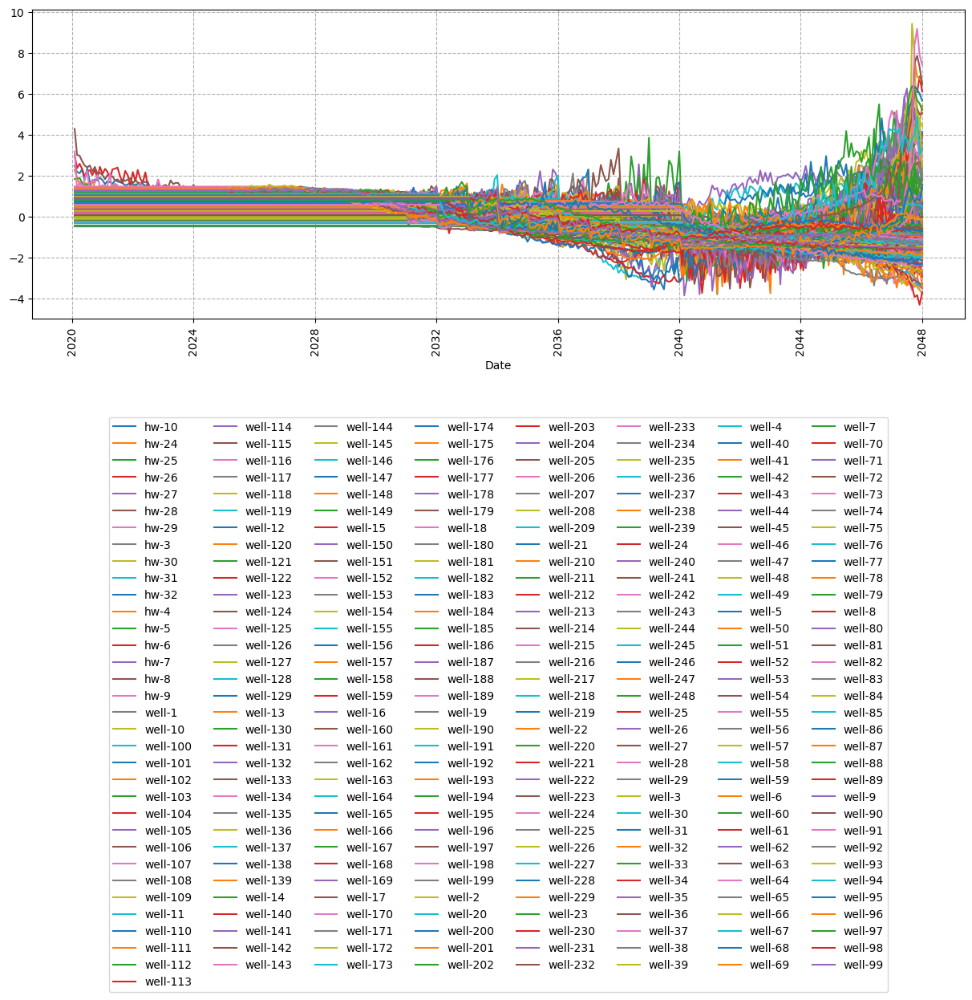

In [56]:
plt.figure(figsize=(15, 5))

for i, col in enumerate(data_scaled.columns):
    plt.plot(data_scaled.index, data_scaled[col], label=col, linestyle=ls[i % len(ls)])

leg = plt.legend(loc="upper center", frameon=True, bbox_to_anchor=(0.5, -0.3), ncol=8)

plt.grid(ls="--")
plt.xlabel("Date")
plt.xticks(rotation=90)
plt.show()

Выделяем признаки

In [57]:
# Извлечение признаков для каждого временного ряда (скважины)
# Правильный выбор: column_id="cat" (идентификатор скважины), column_sort="date", column_value="oil"
# Сначала удаляем NaN значения в целевой переменной
df_clean = df.dropna(subset=["oil"])

extracted_features = extract_features(df_clean, column_id="cat", column_sort="date", column_value="oil")
impute(extracted_features)
print(extracted_features.head())

Feature Extraction: 100%|██████████| 38/38 [00:26<00:00,  1.43it/s]
c:\Users\Lenovo\anaconda3\Lib\site-packages\tsfresh\utilities\dataframe_functions.py:198: RuntimeWarning: The columns ['oil__query_similarity_count__query_None__threshold_0.0'] did not have any finite values. Filling with zeros.
  warnings.warn(


       oil__variance_larger_than_standard_deviation  oil__has_duplicate_max  \
hw-10                                          1.00                    0.00   
hw-24                                          1.00                    0.00   
hw-25                                          1.00                    0.00   
hw-26                                          1.00                    0.00   
hw-27                                          0.00                    1.00   

       oil__has_duplicate_min  oil__has_duplicate  oil__sum_values  \
hw-10                    0.00                0.00        248401.68   
hw-24                    0.00                0.00        388919.96   
hw-25                    0.00                0.00        381610.67   
hw-26                    0.00                0.00          7038.74   
hw-27                    1.00                1.00             0.00   

       oil__abs_energy  oil__mean_abs_change  oil__mean_change  \
hw-10     378819016.16                

- Можете ли мы выделить скважины которые по вашей "экспертной" оценке попадают в отдельные кластера?
- На какие свойства профилей вы опирались при определении кластеров?
<br>
<br>
Порстроение кластермапа

In [ ]:
# Initialize empty lists to store distortions and silhouette scores
distortions = []
silhouette = []

# Specify the range of 'k' values we want to test (number of clusters)
n = range(1, 10)

# Loop over each 'k' value
for k in tqdm(n):
    # Initialize a TimeSeriesKMeans model
    model = TimeSeriesKMeans(
        n_clusters=k,  # number of clusters
        metric="dtw",  # use dynamic time warping distance
        n_jobs=1,  # number of parallel jobs
        max_iter=10,  # maximum number of iterations
        random_state=0,  # random state for reproducibility
    )
    # Fit the model to the data
    model.fit(data.T)
    # Calculate and append the model's inertia (sum of squared distances of samples to their closest cluster center)
    distortions.append(model.inertia_)

    # Calculate and append silhouette score (measure of how similar an object is to its own cluster compared to other clusters)
    # for k > 1, since silhouette score is not defined for a single cluster
    if k > 1:
        silhouette.append(silhouette_score(data_scaled.T, model.labels_))

# Plot the distortions as a function of 'k'
plt.figure(figsize=(10, 4))
plt.plot(n, distortions, "bx-")
plt.xlabel("k")
plt.ylabel("Distortion")
plt.title("Elbow Method")
plt.show()

# Plot the silhouette scores as a function of 'k'
plt.figure(figsize=(10, 4))
plt.plot(n[1:], silhouette, "bx-")
plt.xlabel("k")
plt.ylabel("Silhouette score")
plt.title("Silhouette")
plt.show()

  0%|          | 0/9 [00:00<?, ?it/s]

По методу локтя видим резкий спад до двух кластеров выход в плоскость на уже на третьем кластере
По методу силуэта видим, что он достигает нуля на 4 кластере

Проверим отобразив кластеры на диограммах

Четыре кластера

In [ ]:
# Number of clusters to be generated
n_clusters = 4

# Initialize the Time Series K-Means model
# n_clusters: the number of clusters to form
# metric: the distance metric to be used, in this case, Dynamic Time Warping (DTW)
# n_jobs: the number of CPU cores to use for computation, 1 means use one core (consider setting to -1 for using all cores)
# max_iter: maximum number of iterations of the k-means algorithm for a single run
# random_state: determines random number generation for centroid initialization, using an int will guarantee the same results across different calls
model = TimeSeriesKMeans(
    n_clusters=n_clusters, metric="dtw", n_jobs=-1, max_iter=100, random_state=0
)

# Fit the model to the data
# Here the data is transposed (.T) because the TimeSeriesKMeans expects the time dimension to be the last
model.fit(data.T)

TimeSeriesKMeans(max_iter=100, metric='dtw', n_clusters=4, n_jobs=-1,
                 random_state=0)

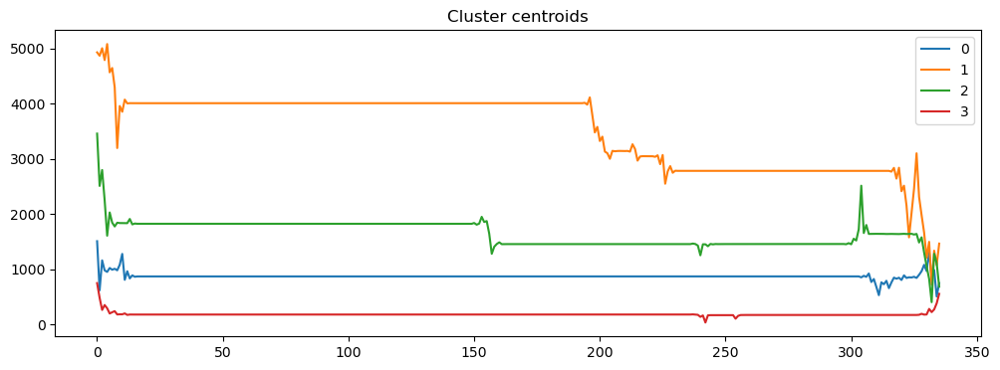

In [ ]:
# Create a new figure with specified size
plt.figure(figsize=(12, 4))

# Iterate over each cluster
for cluster_number in range(n_clusters):
    # Plot the centroid of each cluster
    # The cluster centers are assumed to be 3D with shape (n_clusters, n_features, n_samples)
    # We're extracting the first feature across all samples for each cluster and plotting that
    plt.plot(model.cluster_centers_[cluster_number, :, 0].T, label=str(cluster_number))

# Set the title of the plot
plt.title("Cluster centroids")

# Add a legend to the plot
plt.legend()

# Display the plot
plt.show()

В результате сравнения кластеров оставим 4 кластера, так как так мы не потеряем скважины

In [ ]:
# The transpose operation is used to swap the rows and columns of 'data'.
df_transformed = data.T

# Use the trained model to predict the cluster for each instance in the dataset.
# The results are added as a new column 'cluster' in the dataframe.
df_transformed["cluster"] = model.predict(df_transformed)

# Convert the 'cluster' column into a dictionary.
# The keys in the dictionary are the index values from the dataframe,
# and the values in the dictionary are the corresponding values in the 'cluster' column.
d = dict(df_transformed["cluster"])

d

c:\Users\Lenovo\anaconda3\Lib\site-packages\tslearn\utils\utils.py:129: UserWarning: 2-Dimensional data passed. Assuming these are 265 1-dimensional timeseries
  warnings.warn(


{'hw-10': np.int64(2),
 'hw-24': np.int64(2),
 'hw-25': np.int64(2),
 'hw-26': np.int64(3),
 'hw-27': np.int64(3),
 'hw-28': np.int64(3),
 'hw-29': np.int64(1),
 'hw-3': np.int64(1),
 'hw-30': np.int64(1),
 'hw-31': np.int64(3),
 'hw-32': np.int64(1),
 'hw-4': np.int64(3),
 'hw-5': np.int64(3),
 'hw-6': np.int64(1),
 'hw-7': np.int64(3),
 'hw-8': np.int64(3),
 'hw-9': np.int64(3),
 'well-1': np.int64(1),
 'well-10': np.int64(1),
 'well-100': np.int64(2),
 'well-101': np.int64(0),
 'well-102': np.int64(1),
 'well-103': np.int64(1),
 'well-104': np.int64(3),
 'well-105': np.int64(1),
 'well-106': np.int64(0),
 'well-107': np.int64(2),
 'well-108': np.int64(2),
 'well-109': np.int64(2),
 'well-11': np.int64(1),
 'well-110': np.int64(0),
 'well-111': np.int64(0),
 'well-112': np.int64(1),
 'well-113': np.int64(1),
 'well-114': np.int64(0),
 'well-115': np.int64(0),
 'well-116': np.int64(0),
 'well-117': np.int64(2),
 'well-118': np.int64(3),
 'well-119': np.int64(2),
 'well-12': np.int64(1

Присваиваю кластера скважинам

In [ ]:
# Map the 'well' column of the DataFrame 'df' to a new column 'cluster' using the dictionary 'd'
df["cluster"] = df["cat"].map(d)

# Display the updated DataFrame 'df'
df

,cat,date,gor,gas,oil,watercut,water,bhp,group,water_inj,cluster
0,hw-3,2020-02-01,731.41,3660375.42,5004.51,0.00,0.00,3274.06,P,NaN,1.00
1,hw-3,2020-03-01,731.41,3782298.54,5171.21,0.00,0.00,3237.29,P,NaN,1.00
2,hw-3,2020-04-01,731.41,3571576.79,4883.11,0.00,0.00,3221.12,P,NaN,1.00
3,hw-3,2020-05-01,731.41,3653934.82,4995.71,0.00,0.00,3196.40,P,NaN,1.00
4,hw-3,2020-06-01,731.41,3611093.24,4937.13,0.00,0.00,3187.04,P,NaN,1.00
...,...,...,...,...,...,...,...,...,...,...,...
82387,inj-1,2047-09-01,NaN,NaN,NaN,NaN,NaN,5995.50,I,3935.77,NaN
82388,inj-1,2047-10-01,NaN,NaN,NaN,NaN,NaN,5993.50,I,3738.68,NaN
82389,inj-1,2047-11-01,NaN,NaN,NaN,NaN,NaN,6000.70,I,3856.02,NaN
82390,inj-1,2047-12-01,NaN,NaN,NaN,NaN,NaN,5998.22,I,4112.03,NaN


Отображаю 4 кластера скважин на диаграмме

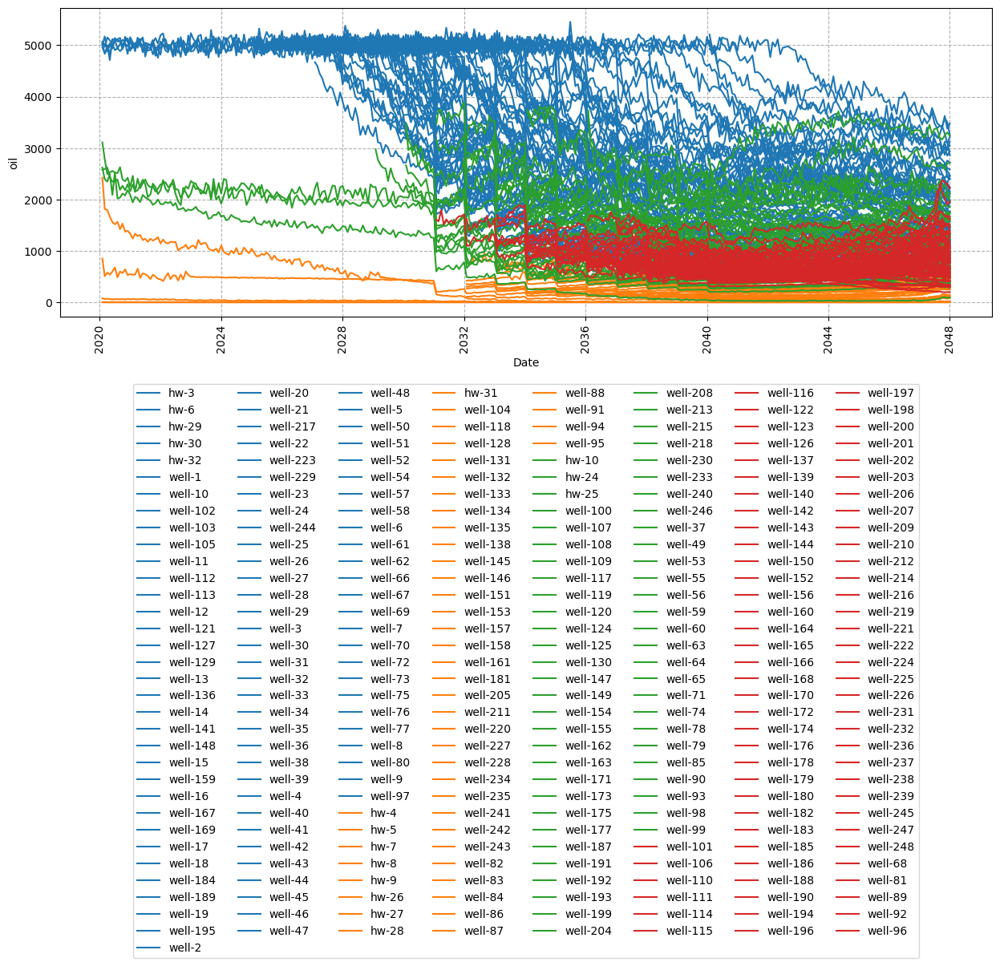

In [ ]:
# Define a list of colors to be used for different clusters
color = ["C0", "C1", "C2", "C3"]

plt.figure(figsize=(15, 5))

# Iterate over each unique cluster in the DataFrame
for j, cluster in enumerate(df["cluster"].unique()):
    # Create a subset DataFrame for each cluster
    df_cluster = df[df["cluster"] == cluster]

    # Iterate over each unique well within the current cluster
    for i, well in enumerate(df_cluster["cat"].unique()):
        df_well = df_cluster[df_cluster["cat"] == well]

        # Plot the qoil over time for each well, assigning a unique color and label
        plt.plot(
            df_well["date"],
            df_well["oil"],
            label=well,
            color=color[
                j % len(color)
            ],  # Use modulo operation to prevent index error if there are more clusters than colors
        )

# Set the legend at the specified location with a box around it
leg = plt.legend(loc="upper center", frameon=True, bbox_to_anchor=(0.5, -0.2), ncol=8)

plt.grid(ls="--")

# Set the labels for the x and y axes
plt.xlabel("Date")
plt.ylabel("oil")
plt.xticks(rotation=90)
plt.show()

По диаграмме видно, что необходимо всё-таки использовать 3 кластера, так как значения кластера, отображённого красным цветом лежит в диапазоне кластера, отображённого залёным цветом

Отобразим кластерную карту для нахождения свяханных 

c:\Users\Lenovo\anaconda3\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
c:\Users\Lenovo\anaconda3\Lib\site-packages\seaborn\matrix.py:530: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,
c:\Users\Lenovo\anaconda3\Lib\site-packages\seaborn\matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
c:\Users\Lenovo\anaconda3\Lib\site-packages\seaborn\matrix.py:530: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


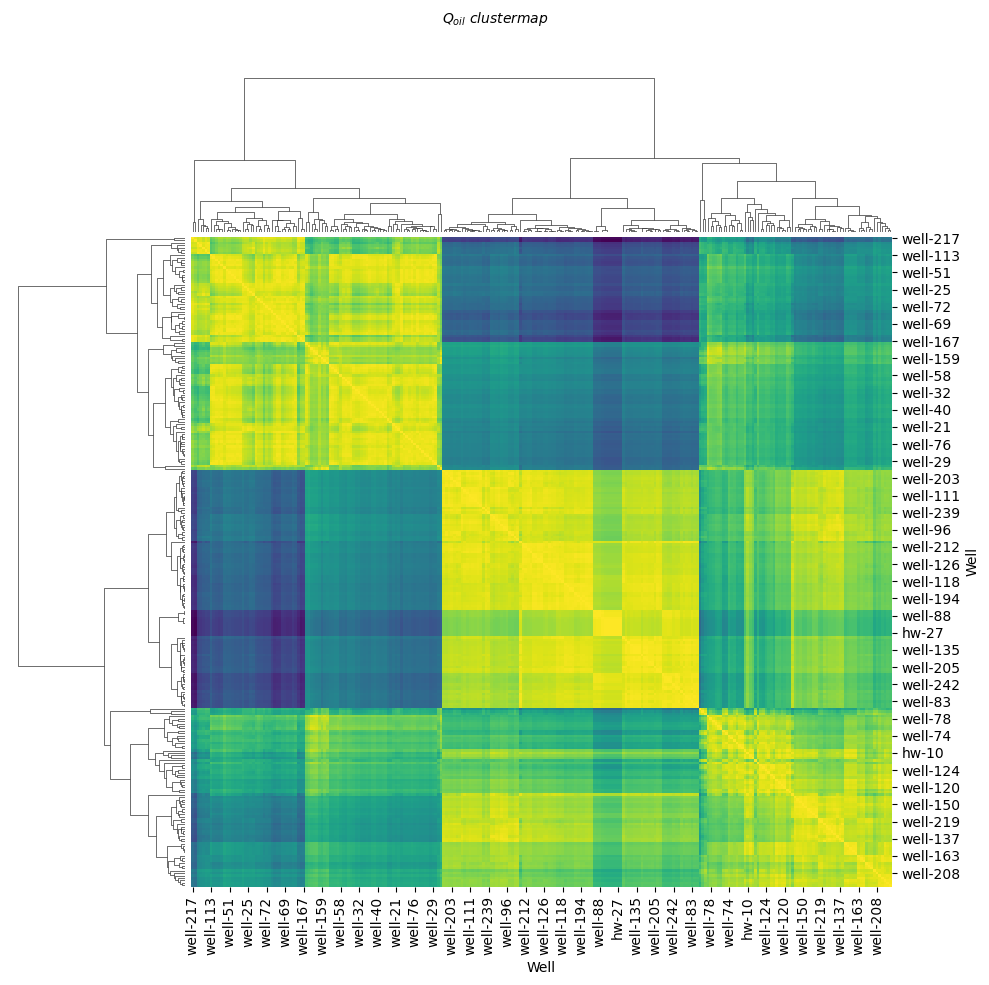

In [ ]:
# Set the size for the labels on the plot
size = 10

# Transpose the original data and convert it to a numpy array
# This is done because the pdist function expects rows to represent observations (wells in this case)
# and columns to represent variables (time points in this case)
series = data.copy().T.to_numpy()

# Compute the pairwise distances between all wells using the Dynamic Time Warping (DTW) method
# DTW is a measure used to compute the distance between two temporal sequences, which may vary in speed
distances = pdist(series, dtw)

# Convert the condensed distance matrix returned by pdist into a square matrix
# and create a DataFrame using the well names as the row and column labels
distance_matrix = pd.DataFrame(
    data=squareform(distances), index=data.columns, columns=data.columns
)

# Create a clustermap (a type of heatmap) of the distance matrix
# viridis_r is a sequential colormap (reversed)
# cbar_pos=None removes the colorbar
cg = sns.clustermap(
    distance_matrix,
    cmap="viridis_r",
    cbar_pos=None,
)

cg.fig.suptitle(r"$Q_{oil}\ clustermap$", size=size)
plt.ylabel("Distance")
ax = cg.ax_heatmap
ax.set_xlabel("Well", size=size)
ax.set_ylabel("Well", size=size)
cg.fig.subplots_adjust(top=0.92)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

Работаю дальше с четырьмя кластерами

Построение дендрограммы

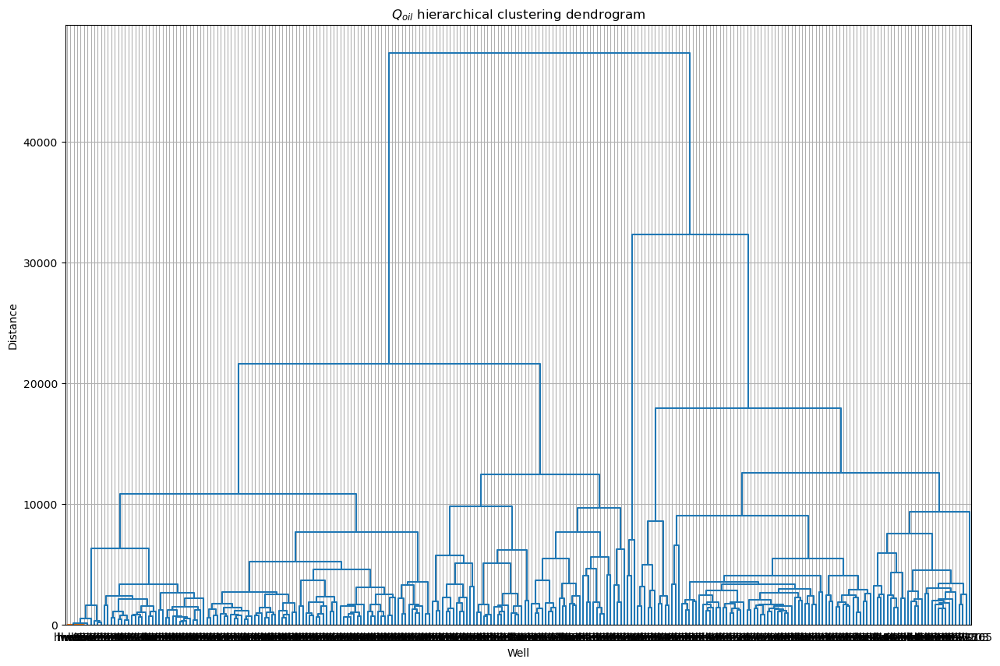

In [ ]:
plt.figure(figsize=(15, 10))

# Perform hierarchical clustering using the linkage function
# distances: A precomputed matrix of distances between points (assumed to be provided)
# method="average": The linkage method to use. 'average' linkage computes the average distance between clusters
# metric="euclidean": The distance metric to use. In this case, Euclidean distance
# optimal_ordering=True: This reorders the linkage matrix so that the pairwise distances between successive leaves are minimal
links = linkage(distances, method="average", metric="euclidean", optimal_ordering=True)

plt.title(r"$Q_{oil}$" + " hierarchical clustering dendrogram")

plt.xlabel("Well", fontsize=10)
plt.ylabel("Distance")

# Generate the dendrogram plot
# links: The hierarchical clustering encoded as a linkage matrix
# color_threshold=2: The color threshold for the dendrogram. All the descendent links deeper than color_threshold are colored the same
# leaf_font_size=10: The font size for the leaf labels
# labels=data.columns: The labels for the leaves (assumed to be the columns of a DataFrame 'data')
# leaf_rotation=0: Rotates the leaf labels. Here, it's set to 0, so the labels are not rotated
dn = dendrogram(
    links, color_threshold=2, leaf_font_size=10, labels=data.columns, leaf_rotation=0
)

plt.grid()
plt.show()

- Совпадают ли ваши "экспертные" кластера с тем, что получилось путем кластеризации с помощью алгоритма DTW?
- Какие скважины не совпадают с вашей оценкой?
<br>
<br>
Создадим датафрейм с именем скажины и ее принадлежность к кластеру 

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17072\2882300218.py:57: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


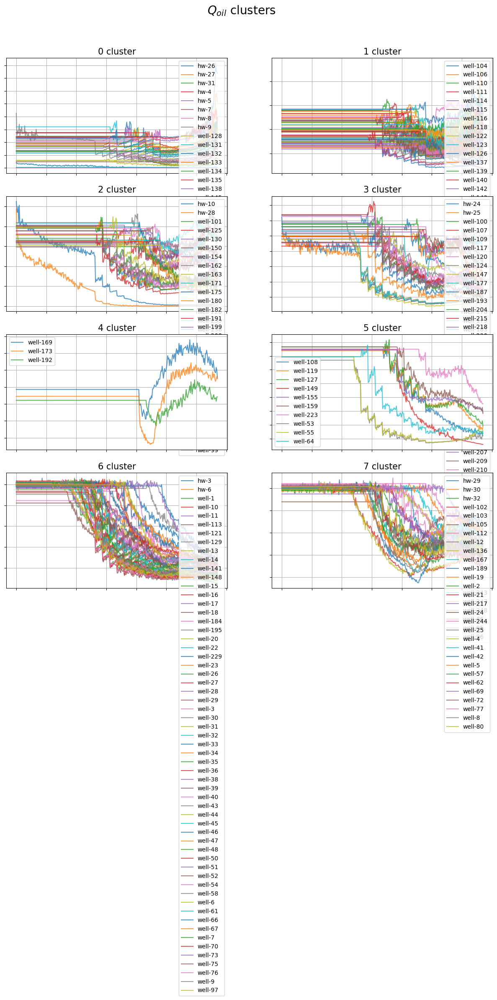

In [ ]:
# List to store names of wells
well_names_list = np.asarray(data.columns)
# List to store the final well and cluster information
final_well_list = []
final_cluster_list = []


# Define function to visualize clusters
def visualize_clusters(
    series, links, num_clusters, num_series_to_draw=3, make_gray=False
):
    # Perform hierarchical clustering and get cluster assignments
    results = fcluster(links, num_clusters, criterion="maxclust")
    s = pd.Series(results)
    clusters = s.unique()

    # Determine the number of rows and columns for the plot
    ncols = 2
    nrows = np.ceil(len(clusters) / float(ncols)).astype(int)

    count = 0
    # Create subplots
    f, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(15, 4 * nrows))
    for row in range(nrows):
        for col in range(ncols):
            ax = axs[row, col] if nrows > 1 else axs[col]
            cluster_idx = row * ncols + col
            if cluster_idx >= len(clusters):
                ax.axis("off")
                continue

            cluster_indices = s[s == cluster_idx + 1].index
            num_series_to_select = min(num_series_to_draw, len(cluster_indices))
            cluster_indices = np.random.choice(
                cluster_indices, num_series_to_select, replace=False
            )

            well_list = well_names_list[sorted(cluster_indices)].tolist()
            cluster_list = [count] * len(well_list)

            series_to_plot = series[sorted(cluster_indices), :]
            plt.suptitle(r"$Q_{oil}$" + " clusters", fontsize=20)

            for i, y in enumerate(series_to_plot):
                color = "gray" if make_gray else None
                ax.plot(y, color=color, alpha=0.75, label=well_list[i])
                ax.set_title(str(count) + " cluster", fontsize=15)
                ax.get_xaxis().set_ticklabels([])
                ax.get_yaxis().set_ticklabels([])

            final_well_list.extend(well_list)
            final_cluster_list.extend(cluster_list)
            count += 1
            ax.grid(True)
            ax.legend()

    plt.tight_layout()
    plt.subplots_adjust(top=0.90)


# Number of clusters and series to draw
num_clusters = 8
num_series_to_draw = 100
make_gray = False

visualize_clusters(np.array(series), links, num_clusters, num_series_to_draw, make_gray)

In [ ]:
df_transformed.head()

date,2020-02-01 00:00:00,2020-03-01 00:00:00,2020-04-01 00:00:00,2020-05-01 00:00:00,2020-06-01 00:00:00,2020-07-01 00:00:00,2020-08-01 00:00:00,2020-09-01 00:00:00,2020-10-01 00:00:00,2020-11-01 00:00:00,2020-12-01 00:00:00,2021-01-01 00:00:00,2021-02-01 00:00:00,2021-03-01 00:00:00,2021-04-01 00:00:00,2021-05-01 00:00:00,2021-06-01 00:00:00,2021-07-01 00:00:00,2021-08-01 00:00:00,2021-09-01 00:00:00,2021-10-01 00:00:00,2021-11-01 00:00:00,2021-12-01 00:00:00,2022-01-01 00:00:00,2022-02-01 00:00:00,2022-03-01 00:00:00,2022-04-01 00:00:00,2022-05-01 00:00:00,2022-06-01 00:00:00,2022-07-01 00:00:00,2022-08-01 00:00:00,2022-09-01 00:00:00,2022-10-01 00:00:00,2022-11-01 00:00:00,2022-12-01 00:00:00,2023-01-01 00:00:00,2023-02-01 00:00:00,2023-03-01 00:00:00,2023-04-01 00:00:00,2023-05-01 00:00:00,2023-06-01 00:00:00,2023-07-01 00:00:00,2023-08-01 00:00:00,2023-09-01 00:00:00,2023-10-01 00:00:00,2023-11-01 00:00:00,2023-12-01 00:00:00,2024-01-01 00:00:00,2024-02-01 00:00:00,2024-03-01 00:00:00,2024-04-01 00:00:00,2024-05-01 00:00:00,2024-06-01 00:00:00,2024-07-01 00:00:00,2024-08-01 00:00:00,2024-09-01 00:00:00,2024-10-01 00:00:00,2024-11-01 00:00:00,2024-12-01 00:00:00,2025-01-01 00:00:00,2025-02-01 00:00:00,2025-03-01 00:00:00,2025-04-01 00:00:00,2025-05-01 00:00:00,2025-06-01 00:00:00,2025-07-01 00:00:00,2025-08-01 00:00:00,2025-09-01 00:00:00,2025-10-01 00:00:00,2025-11-01 00:00:00,2025-12-01 00:00:00,2026-01-01 00:00:00,2026-02-01 00:00:00,2026-03-01 00:00:00,2026-04-01 00:00:00,2026-05-01 00:00:00,2026-06-01 00:00:00,2026-07-01 00:00:00,2026-08-01 00:00:00,2026-09-01 00:00:00,2026-10-01 00:00:00,2026-11-01 00:00:00,2026-12-01 00:00:00,2027-01-01 00:00:00,2027-02-01 00:00:00,2027-03-01 00:00:00,2027-04-01 00:00:00,2027-05-01 00:00:00,2027-06-01 00:00:00,2027-07-01 00:00:00,2027-08-01 00:00:00,2027-09-01 00:00:00,2027-10-01 00:00:00,2027-11-01 00:00:00,2027-12-01 00:00:00,2028-01-01 00:00:00,2028-02-01 00:00:00,2028-03-01 00:00:00,2028-04-01 00:00:00,2028-05-01 00:00:00,2028-06-01 00:00:00,2028-07-01 00:00:00,2028-08-01 00:00:00,2028-09-01 00:00:00,2028-10-01 00:00:00,2028-11-01 00:00:00,2028-12-01 00:00:00,2029-01-01 00:00:00,2029-02-01 00:00:00,2029-03-01 00:00:00,2029-04-01 00:00:00,2029-05-01 00:00:00,2029-06-01 00:00:00,2029-07-01 00:00:00,2029-08-01 00:00:00,2029-09-01 00:00:00,2029-10-01 00:00:00,2029-11-01 00:00:00,2029-12-01 00:00:00,2030-01-01 00:00:00,2030-02-01 00:00:00,2030-03-01 00:00:00,2030-04-01 00:00:00,2030-05-01 00:00:00,2030-06-01 00:00:00,2030-07-01 00:00:00,2030-08-01 00:00:00,2030-09-01 00:00:00,2030-10-01 00:00:00,2030-11-01 00:00:00,2030-12-01 00:00:00,2031-01-01 00:00:00,2031-02-01 00:00:00,2031-03-01 00:00:00,2031-04-01 00:00:00,2031-05-01 00:00:00,2031-06-01 00:00:00,2031-07-01 00:00:00,2031-08-01 00:00:00,2031-09-01 00:00:00,2031-10-01 00:00:00,2031-11-01 00:00:00,2031-12-01 00:00:00,2032-01-01 00:00:00,2032-02-01 00:00:00,2032-03-01 00:00:00,2032-04-01 00:00:00,2032-05-01 00:00:00,2032-06-01 00:00:00,2032-07-01 00:00:00,2032-08-01 00:00:00,2032-09-01 00:00:00,2032-10-01 00:00:00,2032-11-01 00:00:00,2032-12-01 00:00:00,2033-01-01 00:00:00,2033-02-01 00:00:00,2033-03-01 00:00:00,2033-04-01 00:00:00,2033-05-01 00:00:00,2033-06-01 00:00:00,2033-07-01 00:00:00,2033-08-01 00:00:00,2033-09-01 00:00:00,2033-10-01 00:00:00,2033-11-01 00:00:00,2033-12-01 00:00:00,2034-01-01 00:00:00,2034-02-01 00:00:00,2034-03-01 00:00:00,2034-04-01 00:00:00,2034-05-01 00:00:00,2034-06-01 00:00:00,2034-07-01 00:00:00,2034-08-01 00:00:00,2034-09-01 00:00:00,2034-10-01 00:00:00,2034-11-01 00:00:00,2034-12-01 00:00:00,2035-01-01 00:00:00,2035-02-01 00:00:00,2035-03-01 00:00:00,2035-04-01 00:00:00,2035-05-01 00:00:00,2035-06-01 00:00:00,2035-07-01 00:00:00,2035-08-01 00:00:00,2035-09-01 00:00:00,2035-10-01 00:00:00,2035-11-01 00:00:00,2035-12-01 00:00:00,2036-01-01 00:00:00,2036-02-01 00:00:00,2036-03-01 00:00:00,2036-04-01 00:00:00,2036-05-01 00:00:00,2036-06-01 00:00:00,2036-07-01 00:00:00,2036-08-01 00:00:00,2036-09-01 00:0

Cluster number: 0


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17072\3021326429.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f"{row[0]}\n{row.cluster}"


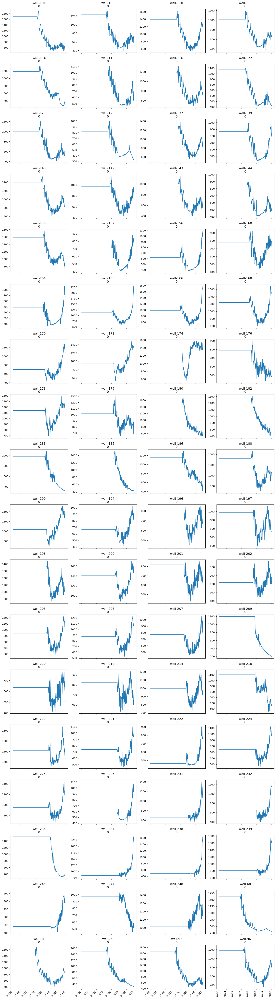

Cluster number: 1


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17072\3021326429.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f"{row[0]}\n{row.cluster}"


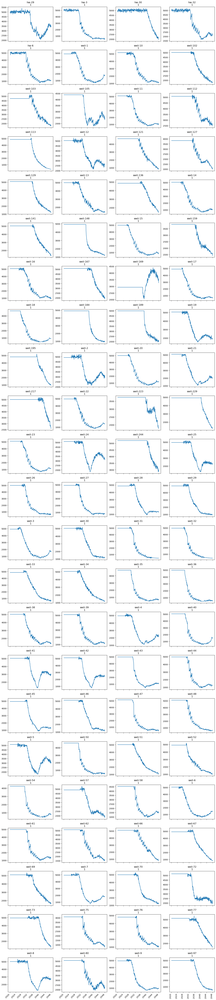

Cluster number: 2


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17072\3021326429.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f"{row[0]}\n{row.cluster}"


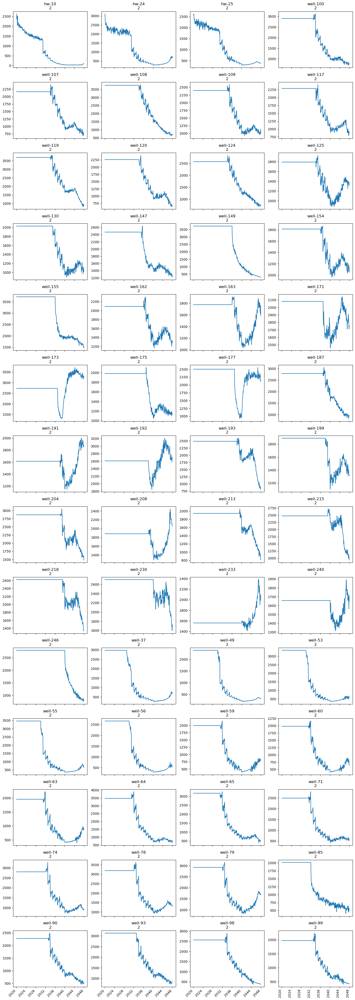

Cluster number: 3


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17072\3021326429.py:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  f"{row[0]}\n{row.cluster}"


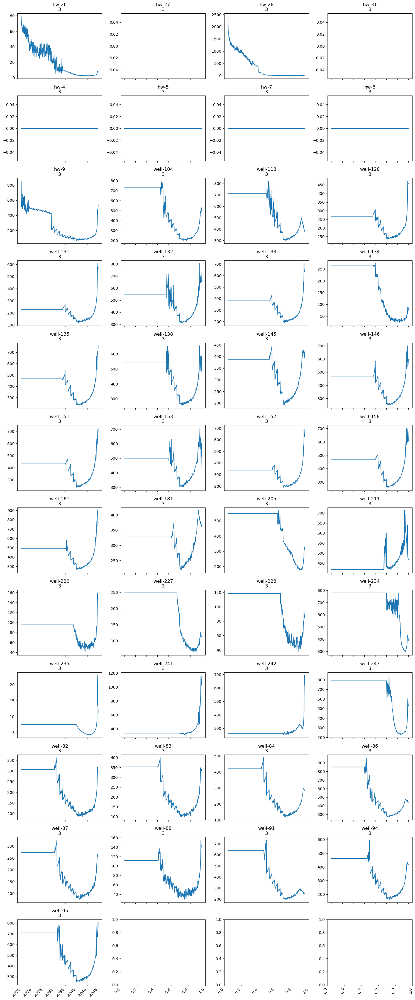

In [ ]:
def plot_cluster_tickers(current_cluster):
    # The number of subplots is determined by the number of rows in the current_cluster dataframe.
    # The layout is arranged in a 4-column grid, with the number of rows determined by dividing the number of data points by 4 and rounding up.
    fig, ax = plt.subplots(
        int(np.ceil(current_cluster.shape[0] / 4)),
        4,
        figsize=(
            15,
            3 * int(np.ceil(current_cluster.shape[0] / 4)),
        ),  # The figure size is determined by the number of subplots
    )
    fig.autofmt_xdate(
        rotation=45
    )  # Rotates the x-axis labels 45 degrees for better visibility

    # Reshape the axis object to a 1D array, so we can iterate over it
    ax = ax.reshape(-1)

    # Iterate over the rows of the dataframe
    for index, (_, row) in enumerate(current_cluster.iterrows()):
        ax[index].plot(
            row.iloc[1:-1]
        )  # Plot the row data, excluding the first and last columns
        ax[index].set_title(
            f"{row[0]}\n{row.cluster}"
        )  # Set the title for each subplot
        plt.xticks(
            rotation=90
        )  # Rotate the x-axis labels 90 degrees for better visibility

    plt.tight_layout()  # Adjusts subplot params so that subplots are nicely fit in the figure
    plt.show()  # Display the figure


# Iterate over the clusters
for cluster in range(n_clusters):
    print(f"Cluster number: {cluster}")
    # For each cluster, filter the dataframe for rows that belong to the current cluster, reset the index, and plot the tickers
    plot_cluster_tickers(
        df_transformed[df_transformed.cluster == cluster].reset_index()
    )

Получилось 4 кластера, однако есть и выбросы. Последний кластер включает в себя скважины , у которых значения в какой-либо период наблюдений был близок к минимуму.

Обновим индексы кластеризованным скважитнам

In [ ]:
# Reset the index of the DataFrame `df_transformed`
# After resetting, the index becomes a new column in the DataFrame
df_transformed_reset = df_transformed.reset_index()

# Select the "well" and "cluster" columns from the DataFrame `df_transformed_reset`
wells_and_clusters = df_transformed_reset[["cat", "cluster"]]
wells_and_clusters

date,cat,cluster
0,hw-10,2
1,hw-24,2
2,hw-25,2
3,hw-26,3
4,hw-27,3
5,hw-28,3
6,hw-29,1
7,hw-3,1
8,hw-30,1
9,hw-31,3


Визуализуруем полученные профили добычи

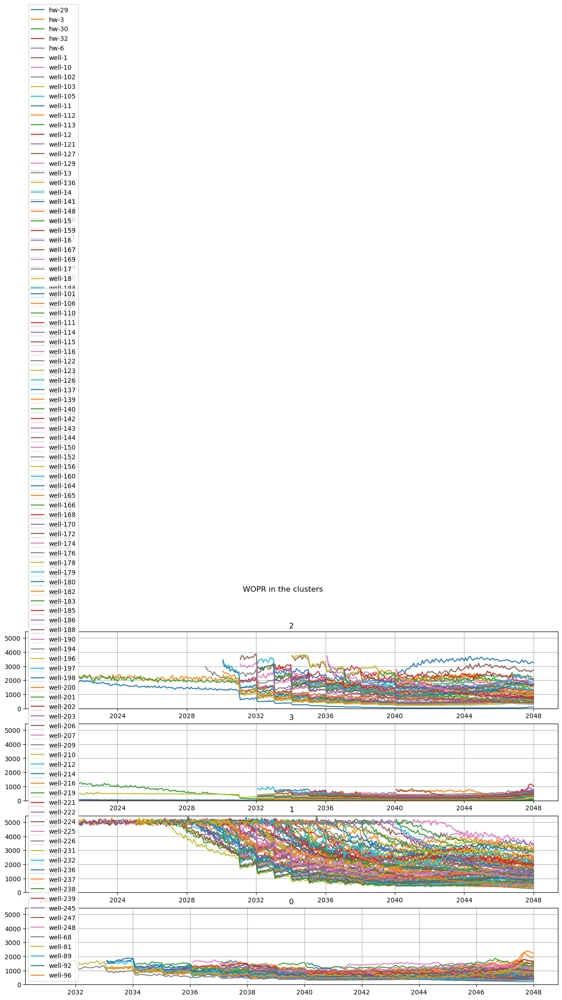

In [ ]:
ymin = df[column].min()
ymax = df[column].max()

plt.figure(figsize=(15, 10))
plt.suptitle("WOPR in the clusters")

# Define the number of rows and columns for subplots
nrows = 4
ncols = 1

index = 1

for cluster in wells_and_clusters["cluster"].unique():
    # Iterate over the unique well values within each cluster
    for well in wells_and_clusters[wells_and_clusters["cluster"] == cluster][
        "cat"
    ].unique():
        # Add a subplot at the current index
        plt.subplot(nrows, ncols, index)

        # Plot the data for the current well
        well_data = df[df["cat"] == well]
        plt.plot(well_data["date"], well_data[column], label=well)

        # Set the y-axis limits
        plt.ylim(ymin, ymax)

    plt.title(cluster)
    plt.legend(loc="lower left")
    plt.grid()

    # Increment the subplot index
    index += 1

- Какие скважины выбиваются из общего паттерна кластера?

Из общего паттерна выделяются скважины, имеющие большее количество дебета нефти к завершению наблюдений 

Загрузим датафрейм с ккординатами скважин

In [ ]:
import pandas as pd

In [ ]:
# Read the excel file into a pandas DataFrame
data = pd.read_csv(f"C:/ИТМО/Нефтянка/clustering/hw/coords.csv")

Отобразим данные координат

In [ ]:


# Convert the 'well' column to string
# This is necessary if the column contains non-string values
data["cat"] = data["cat"].astype("str")

# Convert all the string values in the 'well' column to lower case
# This ensures consistency in case comparison
data["cat"] = data["cat"].str.lower()

# Display the DataFrame
data

,cat,x,y
0,hw-1,69895.00,61474.00
1,hw-2,97263.00,113263.00
2,hw-3,52211.00,84211.00
3,hw-4,52632.00,95579.00
4,hw-5,66947.00,98947.00
5,hw-6,55158.00,91789.00
6,hw-7,34526.00,80000.00
7,hw-8,26947.00,72421.00
8,hw-9,30737.00,56421.00
9,hw-10,32421.00,66105.00


Отобразим данные скважин по кластерам

In [ ]:
wells_and_clusters["cat"] = wells_and_clusters["cat"].astype(str)

wells_and_clusters

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_17072\660921383.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wells_and_clusters["cat"] = wells_and_clusters["cat"].astype(str)


date,cat,cluster
0,hw-10,2
1,hw-24,2
2,hw-25,2
3,hw-26,3
4,hw-27,3
5,hw-28,3
6,hw-29,1
7,hw-3,1
8,hw-30,1
9,hw-31,3


Объединим 2 датафрейма на колнку 'cat'

In [ ]:
data_clustered = data.merge(wells_and_clusters, on="cat", how="left")
data_clustered = data_clustered.dropna(subset=['cluster'])
data_clustered.head()

,cat,x,y,cluster
2,hw-3,52211.00,84211.00,1.00
3,hw-4,52632.00,95579.00,3.00
4,hw-5,66947.00,98947.00,3.00
5,hw-6,55158.00,91789.00,1.00
6,hw-7,34526.00,80000.00,3.00


Визуализируем карту скважин с полученными кластерами

In [ ]:
def discrete_cmap(N, base_cmap=None):
    """
    Create an N-bin discrete colormap from the specified input map

    Parameters
    ----------
    N : int
        The number of colors needed in the colormap.
    base_cmap : str, optional
        The base colormap to use. This should be a name of a colormap recognized by matplotlib.

    Returns
    -------
    newmap : Colormap
        A new colormap with N colors spanning the range of base_cmap.
    """
    base = plt.cm.get_cmap(base_cmap)
    color_list = base(np.linspace(0, 1, N))
    cmap_name = base.name + str(N)
    return base.from_list(cmap_name, color_list, N)


def voronoi_finite_polygons_2d(vor, radius=None):
    """
    Reconstruct infinite Voronoi regions in a 2D diagram to finite
    regions.

    Parameters
    ----------
    vor : scipy.spatial.Voronoi instance
        The input Voronoi diagram.
    radius : float, optional
        The distance to 'points at infinity'. If not provided, the maximum point-to-point
        distance within the input points is used.

    Returns
    -------
    regions : list of lists
        A list of regions of the Voronoi diagram. Each region is a list of indices of the
        Voronoi vertices forming the region.
    vertices : ndarray
        The coordinates of the Voronoi vertices.
    """

    if vor.points.shape[1] != 2:
        raise ValueError("Requires 2D input")

    new_regions = []
    new_vertices = vor.vertices.tolist()

    center = vor.points.mean(axis=0)
    if radius is None:
        radius = np.ptp(vor.points, axis=0).max() * 2

    # Rest of the function remains unchanged
    all_ridges = {}
    for (p1, p2), (v1, v2) in zip(vor.ridge_points, vor.ridge_vertices):
        all_ridges.setdefault(p1, []).append((p2, v1, v2))
        all_ridges.setdefault(p2, []).append((p1, v1, v2))

    # Reconstruct infinite regions
    for p1, region in enumerate(vor.point_region):
        vertices = vor.regions[region]

        if all(v >= 0 for v in vertices):
            # finite region
            new_regions.append(vertices)
            continue

        # Reconstruct a non-finite region
        ridges = all_ridges[p1]
        new_region = [v for v in vertices if v >= 0]

        for p2, v1, v2 in ridges:
            if v2 < 0:
                v1, v2 = v2, v1
            if v1 >= 0:
                # Finite ridge: already in the region
                continue

            # Compute the missing endpoint of an infinite ridge
            t = vor.points[p2] - vor.points[p1]  # Tangent
            t /= np.linalg.norm(t)
            n = np.array([-t[1], t[0]])  # Normal

            midpoint = vor.points[[p1, p2]].mean(axis=0)
            direction = np.sign(np.dot(midpoint - center, n)) * n
            far_point = vor.vertices[v2] + direction * radius

            new_region.append(len(new_vertices))
            new_vertices.append(far_point.tolist())

        # Sort region counterclockwise
        vs = np.asarray([new_vertices[v] for v in new_region])
        c = vs.mean(axis=0)
        angles = np.arctan2(vs[:, 1] - c[1], vs[:, 0] - c[0])
        new_region = np.array(new_region)[np.argsort(angles)]

        new_regions.append(new_region.tolist())

    return new_regions, np.asarray(new_vertices)

Задание:
- Прокластеризуйте временные ряды датасета СOSTA (https://www.researchgate.net/publication/358582459_The_Design_of_an_Open-Source_Carbonate_Reservoir_Model, https://www.researchgate.net/publication/358903422_An_Open_Access_Carbonate_Reservoir_Model, https://researchportal.hw.ac.uk/en/datasets/costa-model-hierarchical-carbonate-reservoir-benchmarking-case-st) используя подхъходящий метод. Вы не ограничены DTW. Можете, например, представить одно или многомерный сигнал как разложение Фурье или набор признаков (TSFresh)
- Попробуйте определить оптимальное количество кластеров. Какой метод оценки вы выбрали для этого типа данных и почему?
- Визуализируйте кластера на карте
- Как пространственно меняются кластера по площади месторождения?
- Какой метод кластеризации выдает наиболее устойчивый результат при использовании данных различной природы?
- Какой метод выдает объекты кластеров которые наиболее сосредоточены рядом друг с другом на карте? Как можно количественно оценить это?

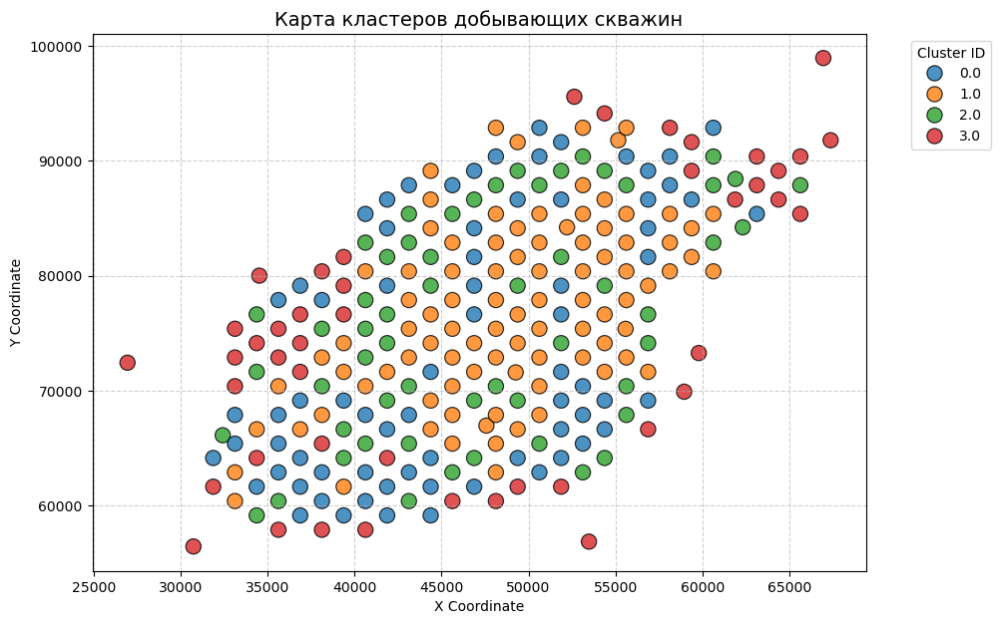

In [ ]:



# Визуализация
plt.figure(figsize=(10, 7))
scatter = sns.scatterplot(
    data=data_clustered, x='x', y='y', 
    hue='cluster', palette='tab10', 
    s=120, edgecolor='black', alpha=0.8,
)

plt.title(f"Карта кластеров добывающих скважин", fontsize=14)
plt.xlabel("X Coordinate")
plt.ylabel("Y Coordinate")
plt.legend(title='Cluster ID', bbox_to_anchor=(1.05, 1))
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

-- Кластеризация при помощи tsfresh

In [ ]:
from tsfresh import extract_features
from tsfresh.feature_extraction import EfficientFCParameters
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

In [ ]:

# 1. Загрузка и фильтрация (только добывающие 'P')
train = pd.read_csv('hw/train.csv')
coords = pd.read_csv('hw/coords.csv')
producers = train[train['group'] == 'P'][['cat', 'date', 'oil']].dropna()
producers.head()

,cat,date,oil
0,hw-3,2020-02-01,5004.51
1,hw-3,2020-03-01,5171.21
2,hw-3,2020-04-01,4883.11
3,hw-3,2020-05-01,4995.71
4,hw-3,2020-06-01,4937.13


Получили данные по датам, скважинам и объёмам добычи нефти

In [ ]:
# 2. Извлечение признаков через tsfresh
# Используем EfficientFCParameters, чтобы не считать слишком тяжелые признаки
extracted_features = extract_features(
    producers, 
    column_id='cat', 
    column_sort='date', 
    default_fc_parameters=EfficientFCParameters()
)



Feature Extraction: 100%|██████████| 38/38 [00:19<00:00,  1.95it/s]


In [ ]:
extracted_features.info()
extracted_features.notnull().sum()
#extracted_features.notna().sum()

<class 'pandas.core.frame.DataFrame'>
Index: 265 entries, hw-10 to well-99
Columns: 777 entries, oil__variance_larger_than_standard_deviation to oil__mean_n_absolute_max__number_of_maxima_7
dtypes: float64(777)
memory usage: 1.6+ MB


oil__variance_larger_than_standard_deviation              265
oil__has_duplicate_max                                    265
oil__has_duplicate_min                                    265
oil__has_duplicate                                        265
oil__sum_values                                           265
                                                         ... 
oil__permutation_entropy__dimension_5__tau_1              265
oil__permutation_entropy__dimension_6__tau_1              265
oil__permutation_entropy__dimension_7__tau_1              265
oil__query_similarity_count__query_None__threshold_0.0      0
oil__mean_n_absolute_max__number_of_maxima_7              265
Length: 777, dtype: int64

In [ ]:
extracted_features.head()

,oil__variance_larger_than_standard_deviation,oil__has_duplicate_max,oil__has_duplicate_min,oil__has_duplicate,oil__sum_values,oil__abs_energy,oil__mean_abs_change,oil__mean_change,oil__mean_second_derivative_central,oil__median,oil__mean,oil__length,oil__standard_deviation,oil__variation_coefficient,oil__variance,oil__skewness,oil__kurtosis,oil__root_mean_square,oil__absolute_sum_of_changes,oil__longest_strike_below_mean,oil__longest_strike_above_mean,oil__count_above_mean,oil__count_below_mean,oil__last_location_of_maximum,oil__first_location_of_maximum,oil__last_location_of_minimum,oil__first_location_of_minimum,oil__percentage_of_reoccurring_values_to_all_values,oil__percentage_of_reoccurring_datapoints_to_all_datapoints,oil__sum_of_reoccurring_values,oil__sum_of_reoccurring_data_points,oil__ratio_value_number_to_time_series_length,oil__maximum,oil__absolute_maximum,oil__minimum,oil__benford_correlation,oil__time_reversal_asymmetry_statistic__lag_1,oil__time_reversal_asymmetry_statistic__lag_2,oil__time_reversal_asymmetry_statistic__lag_3,oil__c3__lag_1,oil__c3__lag_2,oil__c3__lag_3,oil__cid_ce__normalize_True,oil__cid_ce__normalize_False,oil__symmetry_looking__r_0.0,oil__symmetry_looking__r_0.05,oil__symmetry_looking__r_0.1,oil__symmetry_looking__r_0.15000000000000002,oil__symmetry_looking__r_0.2,oil__symmetry_looking__r_0.25,oil__symmetry_looking__r_0.30000000000000004,oil__symmetry_looking__r_0.35000000000000003,oil__symmetry_looking__r_0.4,oil__symmetry_looking__r_0.45,oil__symmetry_looking__r_0.5,oil__symmetry_looking__r_0.55,oil__symmetry_looking__r_0.6000000000000001,oil__symmetry_looking__r_0.65,oil__symmetry_looking__r_0.7000000000000001,oil__symmetry_looking__r_0.75,oil__symmetry_looking__r_0.8,oil__symmetry_looking__r_0.8500000000000001,oil__symmetry_looking__r_0.9,oil__symmetry_looking__r_0.9500000000000001,oil__large_standard_deviation__r_0.05,oil__large_standard_deviation__r_0.1,oil__large_standard_deviation__r_0.15000000000000002,oil__large_standard_deviation__r_0.2,oil__large_standard_deviation__r_0.25,oil__large_standard_deviation__r_0.30000000000000004,oil__large_standard_deviation__r_0.35000000000000003,oil__large_standard_deviation__r_0.4,oil__large_standard_deviation__r_0.45,oil__large_standard_deviation__r_0.5,oil__large_standard_deviation__r_0.55,oil__large_standard_deviation__r_0.6000000000000001,oil__large_standard_deviation__r_0.65,oil__large_standard_deviation__r_0.7000000000000001,oil__large_standard_deviation__r_0.75,oil__large_standard_deviation__r_0.8,oil__large_standard_deviation__r_0.8500000000000001,oil__large_standard_deviation__r_0.9,oil__large_standard_deviation__r_0.9500000000000001,oil__quantile__q_0.1,oil__quantile__q_0.2,oil__quantile__q_0.3,oil__quantile__q_0.4,oil__quantile__q_0.6,oil__quantile__q_0.7,oil__quantile__q_0.8,oil__quantile__q_0.9,oil__autocorrelation__lag_0,oil__autocorrelation__lag_1,oil__autocorrelation__lag_2,oil__autocorrelation__lag_3,oil__autocorrelation__lag_4,oil__autocorrelation__lag_5,oil__autocorrelation__lag_6,oil__autocorrelation__lag_7,oil__autocorrelation__lag_8,oil__autocorrelation__lag_9,"oil__agg_autocorrelation__f_agg_""mean""__maxlag_40","oil__agg_autocorrelation__f_agg_""median""__maxlag_40","oil__agg_autocorrelation__f_agg_""var""__maxlag_40",oil__partial_autocorrelation__lag_0,oil__partial_autocorrelation__lag_1,oil__partial_autocorrelation__lag_2,oil__partial_autocorrelation__lag_3,oil__partial_autocorrelation__lag_4,oil__partial_autocorrelation__lag_5,oil__partial_autocorrelation__lag_6,oil__partial_autocorrelation__lag_7,oil__partial_autocorrelation__lag_8,oil__partial_autocorrelation__lag_9,oil__number_cwt_peaks__n_1,oil__number_cwt_peaks__n_5,oil__number_peaks__n_1,oil__number_peaks__n_3,oil__number_peaks__n_5,oil__number_peaks__n_10,oil__number_peaks__n_50,oil__binned_entropy__max_bins_10,oil__index_mass_quantile__q_0.1,oil__index_mass_quantile__q_0.2,oil__index_mass_quantile__q_0.3,oil__index_mass_quantile__q_0.4,oil__index_mass_quantile_

После извлечения параметров получилось 777 параметров

In [ ]:
# Удаляем колонки с NaN (где признак не удалось посчитать)
extracted_features = extracted_features.dropna(axis=1, how='any')

In [ ]:
extracted_features.info()
extracted_features.notnull().sum()
#extracted_features.notna().sum()

<class 'pandas.core.frame.DataFrame'>
Index: 265 entries, hw-10 to well-99
Columns: 516 entries, oil__variance_larger_than_standard_deviation to oil__mean_n_absolute_max__number_of_maxima_7
dtypes: float64(516)
memory usage: 1.0+ MB


oil__variance_larger_than_standard_deviation    265
oil__has_duplicate_max                          265
oil__has_duplicate_min                          265
oil__has_duplicate                              265
oil__sum_values                                 265
                                               ... 
oil__permutation_entropy__dimension_4__tau_1    265
oil__permutation_entropy__dimension_5__tau_1    265
oil__permutation_entropy__dimension_6__tau_1    265
oil__permutation_entropy__dimension_7__tau_1    265
oil__mean_n_absolute_max__number_of_maxima_7    265
Length: 516, dtype: int64

После удаления осталось 516 параметров

Предобрабатываю данные по фичам

In [ ]:
# 3. Масштабирование
scaler = StandardScaler()
features_scaled = scaler.fit_transform(extracted_features)

# 4. PCA (сохраняем 95% дисперсии)
pca = PCA(n_components=0.95)
features_pca = pca.fit_transform(features_scaled)

Считаем кластера по фичам

  0%|          | 0/9 [00:00<?, ?it/s]

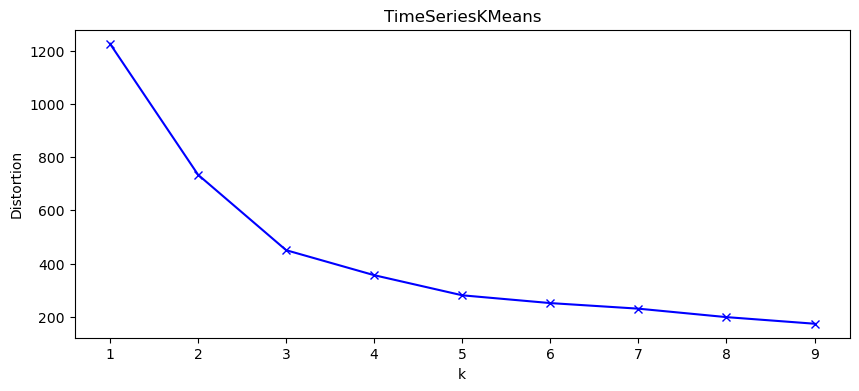

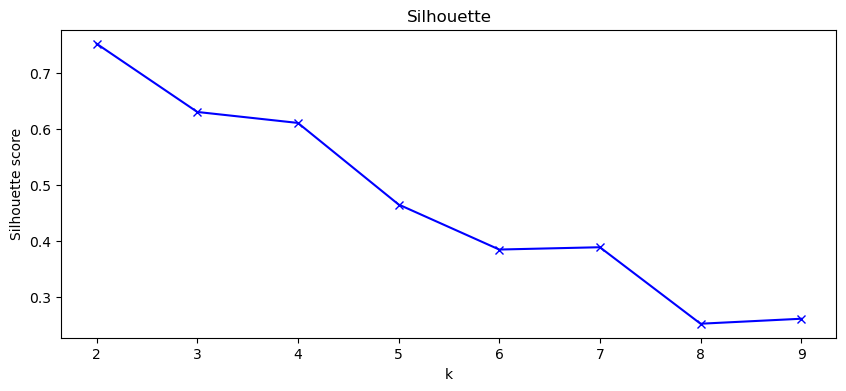

In [ ]:
# Initialize empty lists to store distortions and silhouette scores
distortions = []
silhouette = []

# Specify the range of 'k' values we want to test (number of clusters)
n = range(1, 10)

# Loop over each 'k' value
for k in tqdm(n):
    # Initialize a TimeSeriesKMeans model
    model = TimeSeriesKMeans(
        n_clusters=k,  # number of clusters
        metric="dtw",  # use dynamic time warping distance
        n_jobs=1,  # number of parallel jobs
        max_iter=10,  # maximum number of iterations
        random_state=0,  # random state for reproducibility
    )
    # Fit the model to the data
    model.fit(features_pca.T)
    # Calculate and append the model's inertia (sum of squared distances of samples to their closest cluster center)
    distortions.append(model.inertia_)

    # Calculate and append silhouette score (measure of how similar an object is to its own cluster compared to other clusters)
    # for k > 1, since silhouette score is not defined for a single cluster
    if k > 1:
        silhouette.append(silhouette_score(features_pca.T, model.labels_))

# Plot the distortions as a function of 'k'
plt.figure(figsize=(10, 4))
plt.plot(n, distortions, "bx-")
plt.xlabel("k")
plt.ylabel("Distortion")
plt.title("TimeSeriesKMeans")
plt.show()

# Plot the silhouette scores as a function of 'k'
plt.figure(figsize=(10, 4))
plt.plot(n[1:], silhouette, "bx-")
plt.xlabel("k")
plt.ylabel("Silhouette score")
plt.title("Silhouette")
plt.show()

В сравнении с кластеризацией данных без использования TSFresh кластеризация по характеристикам прт помощи силуэта сходится до 6 кластеров
Метод близжайших соседей для временных рядов показало более стабильную сходимость до 4 кластеров

In [ ]:
# 5. Кластеризация 
kmeans = TimeSeriesKMeans(n_clusters=4, random_state=42, n_init=10)
clusters = kmeans.fit_predict(features_pca)

# Добавляем результаты в DataFrame
results = pd.DataFrame({'cat': extracted_features.index, 'cluster': clusters})
# Соединяем с координатами
map_data = results.merge(coords, on='cat')

In [ ]:
map_data.head()

,cat,cluster,x,y
0,hw-10,2,32421.00,66105.00
1,hw-24,2,62316.00,84211.00
2,hw-25,2,61895.00,88421.00
3,hw-26,0,67368.00,91789.00
4,hw-27,3,53474.00,56842.00


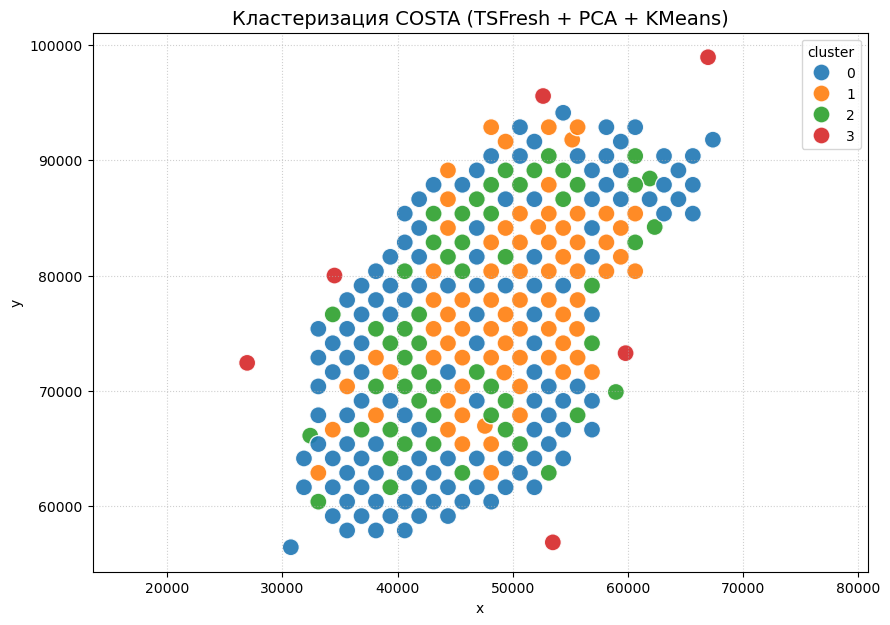

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt



plt.figure(figsize=(10, 7))
sns.scatterplot(
    data=map_data, x='x', y='y', 
    hue='cluster', palette='tab10', 
    s=150, edgecolor='white', alpha=0.9
)

plt.title("Кластеризация COSTA (TSFresh + PCA + KMeans)", fontsize=14)
plt.grid(True, linestyle=':', alpha=0.6)
plt.axis('equal')
plt.show()

- Попробуйте определить оптимальное количество кластеров. Какой метод оценки вы выбрали для этого типа данных и почему?
Оптимальное количество кластеров - 4. TimeSeriesKMeans с метрикой DTW (Dynamic Time Warping) является предпочтительным, так как обычное Евклидово расстояние чувствительно к сдвигам во времени. DTW позволяет сопоставлять формы (паттерны) добычи, даже если пики или спады на скважинах произошли в разные месяцы. Это критично для месторождений, где скважины вводятся в эксплуатацию не одновременно.
- Визуализируйте кластера на карте
Можете видеть визуализацию кластеров при помощи извлечения характеристик и TSfresh, а атакже обычной кластеризации. 
- Как пространственно меняются кластера по площади месторождения? 
Кластеризация по признакам (tsfresh): Выделяет группы скважин со схожими статистическими свойствами (тренд, волатильность). Это помогает найти зоны с похожими геологическими условиями. Например, кластер на краях (тип 3) может указывать на зоны ухудшения пласта или границы залежи.
Прямая кластеризация данных: Больше ориентирована на абсолютные значения добычи. «Разбросанность» результатов здесь может говорить о том, что дебиты сильно зависят от локальных ГТМ или работы конкретного насосного оборудования, а не только от макро-положения на карте.
Кластеризация с учётом характеристик привела кластеризацию скважин 0, 1, 2 типа. Скважины 3 - самого маленького типа наашли своё место только на краях месторождения. Кластеризация же основанная только на данных со скважин, без создания дополнительных характеристик окрасило в кластер 3 и скважины разбросаны по месторождению.
- Какой метод кластеризации выдает наиболее устойчивый результат при использовании данных различной природы?
TimeSeriesKMeans (особенно с метрикой DTW) более устойчив к «шуму» во временных рядах. Однако при использовании «данных различной природы» (например, если добавить к добыче координаты, давление и пористость), часто более стабильным оказывается метод K-Means на извлеченных признаках (tsfresh). Он сводит сложные ряды к набору признаков (среднее, наклон, энтропия), что позволяет алгоритму легче находить закономерности в разнородных данных.
- Какой метод выдает объекты кластеров которые наиболее сосредоточены рядом друг с другом на карте? Как можно количественно оценить это?
Метод: Метод, основанный на признаках (tsfresh + стандартная кластеризация), часто выдает более географически локализованные кластеры, так как геологические параметры пласта (влияющие на признаки ряда) обычно меняются плавно.
Количественная оценка: Для оценки «кучности» кластеров на карте можно использовать:
-- Среднее внутрикластерное расстояние по координатам (чем меньше, тем выше сосредоточенность).
-- Индекс Морана (Moran's I) — статистический показатель пространственной автокорреляции. Он покажет, насколько значения кластеров склонны группироваться в пространстве.